### Import packages

In [14]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
import torch
import numpy as np
import os
from tqdm import tqdm
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
from datasets import load_dataset,DatasetDict,load_from_disk
from torch.utils.data import DataLoader
import torch.nn.functional as F
from itertools import islice
import copy
from torchmetrics.retrieval import RetrievalMAP, RetrievalPrecision
import os
import random
import torch
import torch.nn.functional as F
import torch.nn as nn

### Set seed

In [15]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)

### Set device

In [16]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'

### Define main path

In [17]:
main_path = '/Users/aakashagarwal/Downloads/ir_assignment2/'

### Dataset

#### Load dataset

In [18]:
ds = load_dataset("uoft-cs/cifar10")
ds

DatasetDict({
    train: Dataset({
        features: ['img', 'label'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label'],
        num_rows: 10000
    })
})

#### Test on small dataset

In [19]:
# ds_train = ds['train'].select(range(1000))
# ds_test = ds['test'].select(range(100))

# ds = DatasetDict({
#     'train': ds_train,
#     'test': ds_test
# })

# ds

### Model load

In [20]:
processor = AutoImageProcessor.from_pretrained("google/vit-large-patch32-384",use_fast=True)
model = AutoModelForImageClassification.from_pretrained("google/vit-large-patch32-384")

### Extract features of training data

#### Feature function

In [21]:
# Set model to evaluation mode
model.eval()

transform = transforms.Compose([
        transforms.Resize((384, 384)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

# Define a function to process and extract features from each image
def extract_features(batch):
    imgs = batch['img']  # This will now be a list of images in a batch

    # Preprocess each image in the batch
    img_tensors = [transform(img).unsqueeze(0).to(device) for img in imgs]  # Add batch dimension and move to device
    img_tensors = torch.cat(img_tensors, dim=0)  # Concatenate to create a batch tensor

    inputs = {'pixel_values': img_tensors}  # Adjust for model input (assuming using Hugging Face models)

    # Forward pass through the model to get features
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)

    hidden_states = outputs.hidden_states  # List of all hidden states

    # Extract the final hidden state
    final_hidden_state = hidden_states[-1]  # Shape: [batch_size, num_patches, hidden_size]
    
    # Optionally, pool the features
    pooled_features = final_hidden_state.mean(dim=1)  # Shape: [batch_size, hidden_size]
    
    # Return the features as a new column for the batch
    return {"features": pooled_features.cpu().numpy()}  # 


#### Create features of train data or load from saved file.

In [22]:

output_dir = main_path+ "features/cifar10/"
os.makedirs(output_dir, exist_ok=True)
output_file = os.path.join(output_dir, "vit_large/")  # Saving in Arrow format

# Check if features already exist
if os.path.exists(output_file):
    print(f"Features file already exists at {output_file}. Loading features...")
    # Load existing features
    ds_feature = load_from_disk(output_file)
else:
    print("Features file does not exist. Extracting features...")

    # Use `map` to apply the feature extraction across the entire dataset
    ds_feature = ds.map(extract_features, batched=True, batch_size=64)

    # Save the dataset with the new features to disk
    ds_feature.save_to_disk(output_file)  # Saving in the Arrow format
    print("Features saved successfully!")

Features file already exists at /Users/aakashagarwal/Downloads/ir_assignment2/features/cifar10/vit_large/. Loading features...


In [23]:
dataset_dict = DatasetDict({
    'train': ds_feature['train'],  # Your original train dataset
    'test': ds_feature['test']     # Your original test dataset
})

# Add index column to the train and test datasets
def add_index(example, idx):
    example['index'] = idx
    return example

# Apply the map function to add the 'index' column
ds_feature['train'] = dataset_dict['train'].map(add_index, with_indices=True)
ds_feature['test'] = dataset_dict['test'].map(add_index, with_indices=True)
ds_feature

DatasetDict({
    train: Dataset({
        features: ['img', 'label', 'features', 'index'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label', 'features', 'index'],
        num_rows: 10000
    })
})

#### Collate function

In [24]:
def custom_collate(batch):
    # Define the transformations you want to apply to the images
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
    ])

    # Extracting each field from the batch
    index = [item['index'] for item in batch]
    images = [transform(item['img']) for item in batch]  # Load and transform images
    labels = torch.tensor([item['label'] for item in batch])          # Convert labels to a tensor
    features = [torch.tensor(item['features']) for item in batch]     # Convert features to tensors
    
    # Return a dictionary with batched data
    return {
        'index': index,
        'img': torch.stack(images),    # Stack image tensors into a single tensor
        'label': labels,
        'features': torch.stack(features),  # Stack feature tensors into a single tensor
    }


#### Dataloader

In [25]:
train_dataloader = DataLoader(ds_feature['train'], batch_size=64, shuffle=True,collate_fn=custom_collate)
test_dataloader = DataLoader(ds_feature['test'], batch_size=64, shuffle=True,collate_fn=custom_collate)

### Random Hyperlane Definition

#### Hash hyperparameters

In [63]:
hash_length = 10
num_hash_table = 10
feature_length = len(ds_feature['train'][0]['features'])

#### Random hyperplanes function

In [64]:
def random_hyperplane(num_hash_table,hash_length,feature_length):
    hyperplanes = []
    
    for i in range(num_hash_table):
        hyperplane = (torch.randn(feature_length,hash_length) - 0.5).to(device)
        hyperplanes.append(hyperplane)
    
    return hyperplanes
        

#### Create random hyperplanes

In [65]:
hyperplanes = random_hyperplane(num_hash_table,hash_length,feature_length)
hyperplanes[0].shape

torch.Size([1024, 10])

### Create Hash Tables for training data

In [66]:
hash_dict_list = []
# Iterate through the dataset
for i in range(len(hyperplanes)):
    hash_dict = dict()
    for batch_idx, data in enumerate(tqdm(train_dataloader, desc="Processing Batches")):
        
        # Extract features and compute hash code
        feature = data['features'].to(device)

        hash_value = (feature @ hyperplanes[i])
        hash_code = torch.where(hash_value > 0, 1, 0)
        
        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        hash_code_list = hash_code.tolist()

        # Iterate through each image and label in the batch
        for j in range(len(hash_code_list)):
            # Create a unique key from the hash code of each image
            hash_code_key = tuple(hash_code_list[j])
            
            # Initialize the list if this hash code key is not yet in the dictionary
            if hash_code_key not in hash_dict:
                hash_dict[hash_code_key] = []
            
            # Append the tuple (batch index, image index, label) to the list of this hash code key
            hash_dict[hash_code_key].append([data['index'][j], data['label'][j].item()])
        
    hash_dict_list.append(hash_dict)
    print(len(hash_dict.keys()))
    # if batch_idx == 10:
    #     break

        

Processing Batches: 100%|██████████| 782/782 [00:34<00:00, 22.49it/s]


994


Processing Batches: 100%|██████████| 782/782 [00:33<00:00, 23.38it/s]


935


Processing Batches: 100%|██████████| 782/782 [00:33<00:00, 23.40it/s]


970


Processing Batches: 100%|██████████| 782/782 [00:33<00:00, 23.23it/s]


991


Processing Batches: 100%|██████████| 782/782 [00:36<00:00, 21.14it/s]


1010


Processing Batches: 100%|██████████| 782/782 [00:33<00:00, 23.23it/s]


990


Processing Batches: 100%|██████████| 782/782 [00:31<00:00, 24.95it/s]


979


Processing Batches: 100%|██████████| 782/782 [00:32<00:00, 23.76it/s]


887


Processing Batches: 100%|██████████| 782/782 [00:32<00:00, 24.09it/s]


910


Processing Batches: 100%|██████████| 782/782 [00:33<00:00, 23.57it/s]

921


#### Number of buckets in each hash table

In [67]:
for i in range(len(hash_dict_list)):
    # Count the number of keys in the hash_dict
    hash_dict_key_count = len(hash_dict_list[i].keys())
    # Print the count
    print(f"The number of keys in hash_dict is: {hash_dict_key_count}")


The number of keys in hash_dict is: 994
The number of keys in hash_dict is: 935
The number of keys in hash_dict is: 970
The number of keys in hash_dict is: 991
The number of keys in hash_dict is: 1010
The number of keys in hash_dict is: 990
The number of keys in hash_dict is: 979
The number of keys in hash_dict is: 887
The number of keys in hash_dict is: 910
The number of keys in hash_dict is: 921


### Hash codes for test data

In [68]:
# Initialize a list to store similar images for each hyperplane
similar_images_list = []

# Iterate through each hyperplane
for i in range(len(hyperplanes)):
    # Create a dictionary to store similar images for this hyperplane
    similar_images = {}

    # Process test data
    for batch_idx, data in enumerate(tqdm(test_dataloader, desc="Processing Test Batches")):
        feature = data['features'].to(device)

        # Compute hash values for the test data
        hash_value = (feature @ hyperplanes[i])
        test_hash_code = torch.where(hash_value > 0, 1, 0)

        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        test_hash_code_list = test_hash_code.tolist()

        # Iterate through each test image
        for j in range(len(test_hash_code_list)):
            # Create a unique key from (batch_idx, i, label)
            test_key = (data['index'][j], data['label'][j].item())  # Convert tensor to tuple

            # Create a unique key from the test hash code
            test_hash_code_key = tuple(test_hash_code_list[j])

            # Check if this hash code exists in the training hash dictionary
            if test_hash_code_key in hash_dict_list[i]:
                # Retrieve the corresponding images and their labels from the training hash dictionary
                similar_images[test_key] = hash_dict_list[i][test_hash_code_key]
            else:
                similar_images[test_key] = []

    # Store the similar images found for this hyperplane
    similar_images_list.append(similar_images)

# Now similar_images_dict contains keys as (batch_idx, i, label) and values as similar images


Processing Test Batches: 100%|██████████| 157/157 [00:06<00:00, 23.82it/s]


In [69]:
len(similar_images_list[0])

10000

### Create union of all hash list

In [70]:
# Initialize the dictionary to store similar images
similar_images_dict = {}

# Iterate through the similar_images_dict to populate similar_images_list
for i in similar_images_list:
    for j in tqdm(i.keys()):
        # Check if the key already exists in similar_images_list
        if j not in similar_images_list:
            similar_images_dict[j] = []  # Initialize the list if it doesn't exist

        similar_images_dict[j].extend(i[j])  # Deep copy of the elements

100%|██████████| 10000/10000 [00:00<00:00, 446430.52it/s]


In [71]:
from tqdm import tqdm

# Initialize the dictionary to store similar images
unique_images_dict = {}

# Iterate through the similar_images_dict to populate unique_images_dict
for i, j in tqdm(similar_images_dict.items()):
    if i not in unique_images_dict:
        unique_images_dict[i] = []  # Initialize the list only if the key doesn't exist

    for k in j:
        if k not in unique_images_dict[i]:  # Check if 'k' is not already in the list
            unique_images_dict[i].append(k)  # Append 'k' to the list


100%|██████████| 10000/10000 [00:49<00:00, 202.85it/s]


In [72]:
# Process each key in similar_images_dict with tqdm
for key, similar_images in tqdm(unique_images_dict.items(), desc="Processing keys"):
    
    test_feature = torch.tensor(ds_feature['test'][key[0]]['features'])
    # Process each similar image for the current key with tqdm
    for i, image in tqdm(enumerate(similar_images), desc=f"Processing similar images for key {key[0]}", leave=False):
        # Assuming image is a list/tuple with at least four elements
        train_feature = torch.tensor(ds_feature['train'][image[0]]['features'])
        
        # Calculate cosine similarity and store it
        similarity_score = F.cosine_similarity(test_feature, train_feature, dim=0)
        image = list(image[:2])  # Make a copy to modify
        # Append the similarity score to the copied list
        image.append(similarity_score.item())
        
        # Update the original list in similar_images
        similar_images[i] = image[:3]
        

Processing keys: 100%|██████████| 10000/10000 [31:50<00:00,  5.23it/s] 


In [73]:
for i  in unique_images_dict.values():
    print(i)
    break

[[32910, 4, 0.16599954664707184], [39928, 6, 0.2933918535709381], [11908, 6, 0.48062774538993835], [20392, 4, 0.1834408938884735], [9143, 4, 0.20239673554897308], [12964, 4, 0.18728823959827423], [4947, 4, 0.21284066140651703], [18040, 4, 0.18362584710121155], [17100, 4, 0.19447556138038635], [33926, 4, 0.19234685599803925], [43747, 5, 0.09036970883607864], [18338, 4, 0.1922507882118225], [15435, 4, 0.18792246282100677], [3434, 4, 0.1272764652967453], [5187, 4, 0.2272084355354309], [30961, 2, 0.3312794864177704], [10377, 6, 0.4635237157344818], [31657, 4, 0.16369011998176575], [30772, 5, 0.2262229025363922], [14996, 4, 0.18947698175907135], [14155, 6, 0.3900735080242157], [26465, 4, 0.16563738882541656], [328, 8, 0.18689705431461334], [31675, 4, 0.17886729538440704], [12857, 4, 0.1656028926372528], [19782, 8, 0.1906854212284088], [4169, 4, 0.17341570556163788], [24726, 4, 0.21157383918762207], [43391, 3, 0.13235250115394592], [3370, 4, 0.2116137444972992], [16023, 4, 0.1924943476915359

### Evaluate

In [82]:
# Define functions to calculate Average Precision (AP) and Precision@K
def average_precision(predictions, targets):
    relevant_indices = (targets == 1).nonzero(as_tuple=True)[0]
    if len(relevant_indices) == 0:
        return 0.0

    precisions = []
    for i, idx in enumerate(relevant_indices, start=1):
        precision_at_i = (targets[:idx + 1].sum() / (idx + 1)).item()
        precisions.append(precision_at_i)

    return sum(precisions) / len(precisions)

def precision_at_k(predictions, targets, k):
    top_k_indices = torch.argsort(predictions, descending=True)[:k]
    top_k_relevant = targets[top_k_indices].sum().item()
    return top_k_relevant / k

# Prepare lists to store metric scores
map_scores = []
precision_1_scores = []
precision_5_scores = []
precision_10_scores = []
precision_50_scores = []

# Example: Iterate over your dataset to calculate metrics
for key, value in tqdm(unique_images_dict.items(), desc="Calculating metrics", total=len(similar_images_list)):
    if len(value) > 0:
        # Sort the values by similarity score (assuming v[4] is the similarity score)
        sorted_value = sorted(value, key=lambda x: x[-1], reverse=True)[:50]
        predictions = torch.tensor([v[2] for v in sorted_value])  # Similarity scores
        targets = torch.tensor([v[1] == key[1] for v in sorted_value], dtype=torch.float32)  # Relevance labels
        
        # Calculate Mean Average Precision for the current sample
        ap = average_precision(predictions, targets)
        map_scores.append(ap)
        
        # Calculate Precision@10 and Precision@50
        p1 = precision_at_k(predictions, targets, k=1)
        precision_1_scores.append(p1)
        p5 = precision_at_k(predictions, targets, k=5)
        precision_5_scores.append(p5)
        p10 = precision_at_k(predictions, targets, k=10)
        precision_10_scores.append(p10)
        p50 = precision_at_k(predictions, targets, k=50)
        precision_50_scores.append(p50)

# Calculate final average metrics
mean_avg_precision = sum(map_scores) / len(map_scores) if map_scores else 0.0
precision_1 = sum(precision_1_scores) / len(precision_1_scores) if precision_1_scores else 0.0
precision_5 = sum(precision_5_scores) / len(precision_5_scores) if precision_5_scores else 0.0
precision_10 = sum(precision_10_scores) / len(precision_10_scores) if precision_10_scores else 0.0
precision_50 = sum(precision_50_scores) / len(precision_50_scores) if precision_50_scores else 0.0

# Print results
print("Mean Average Precision (mAP):", mean_avg_precision)
print("Precision@1:", precision_1)
print("Precision@5:", precision_5)
print("Precision@10:", precision_10)
print("Precision@50:", precision_50)


Calculating metrics: 10000it [00:02, 3692.30it/s]          

Mean Average Precision (mAP): 0.8468610746848682
Precision@1: 0.8746864653356075
Precision@5: 0.8276111166850606
Precision@10: 0.786254640313033
Precision@50: 0.6181438747867964


In [97]:

for i,j in unique_images_dict.items():
    print(ds_feature['test'][i]['img'],ds_feature['train'][j[0]]['img'])
    break

[<PIL.PngImagePlugin.PngImageFile image mode=RGB size=32x32 at 0x312D77A10>, <PIL.PngImagePlugin.PngImageFile image mode=RGB size=32x32 at 0x312D74CB0>] [<PIL.PngImagePlugin.PngImageFile image mode=RGB size=32x32 at 0x312D74980>, <PIL.PngImagePlugin.PngImageFile image mode=RGB size=32x32 at 0x312D740B0>, <PIL.PngImagePlugin.PngImageFile image mode=RGB size=32x32 at 0x312D742F0>]


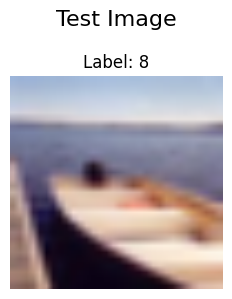

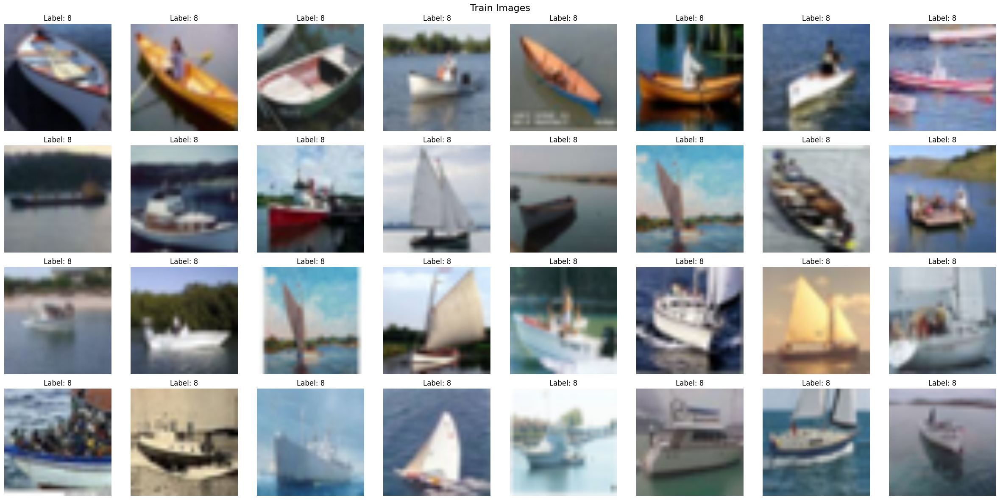

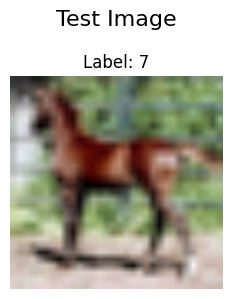

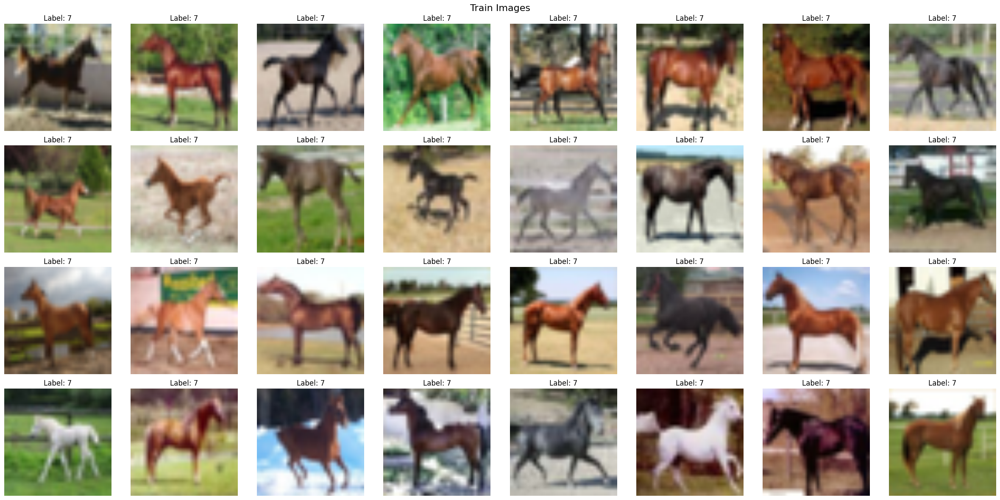

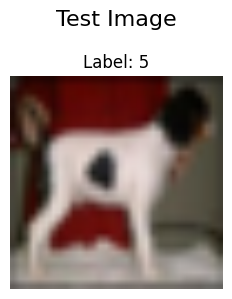

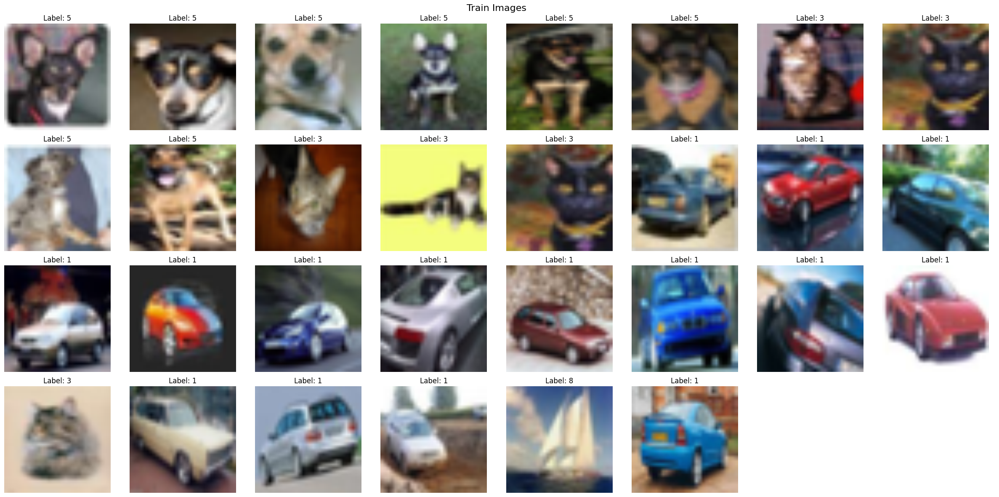

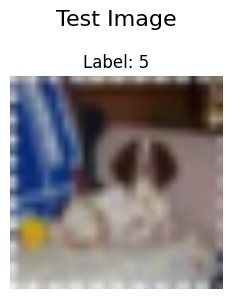

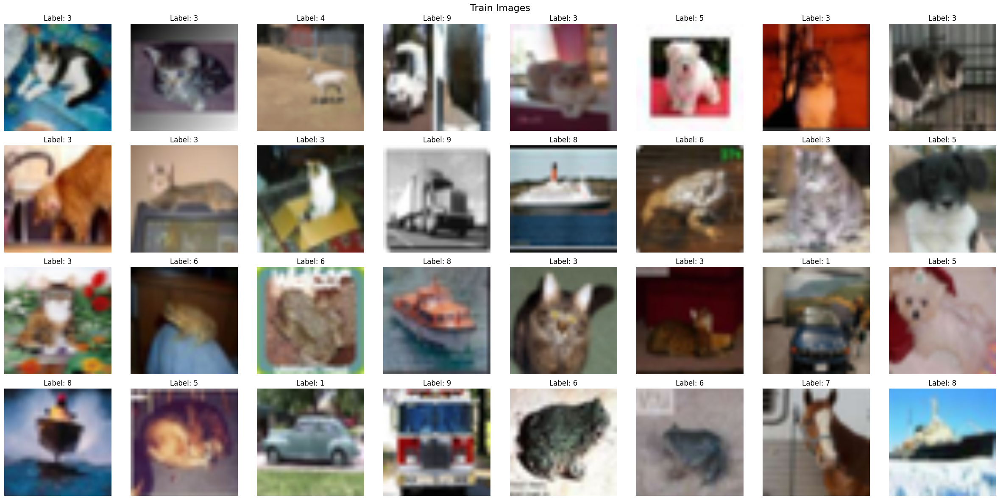

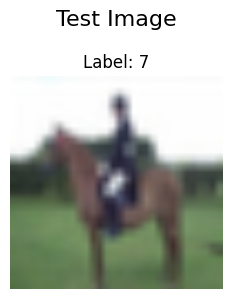

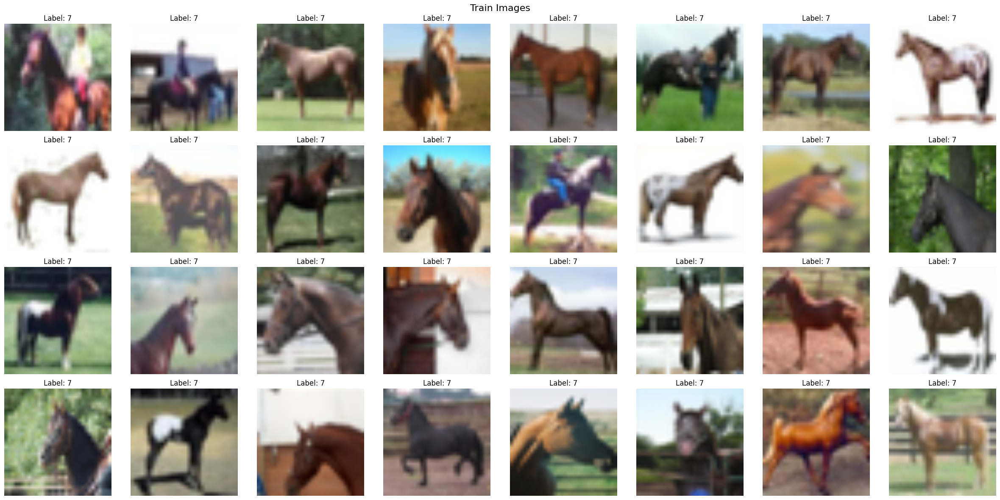

In [155]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a consistent size
    transforms.ToTensor(),          # Convert PIL images to tensors
])

# Function to display images in a grid
def show_images_grid(images, labels, rows=3, cols=4, title=None):
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    if title:
        fig.suptitle(title, fontsize=16)
    
    # Flatten axes if it’s a 2D array; otherwise, wrap it in a list for consistency
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (img, lbl) in enumerate(zip(images, labels)):
        if idx >= rows * cols:
            break
        ax = axes[idx]
        ax.imshow(img.permute(1, 2, 0))  # Convert CHW to HWC for display
        ax.set_title(f'Label: {lbl}')
        ax.axis('off')
    
    # Turn off any extra axes
    for ax in axes[len(images):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
random_choices = random.sample(range(0, len(ds_feature['test'])), 5)

# Get a batch of original images and labels
for c,(i, j) in enumerate(unique_images_dict.items()):
    top = sorted(j, key=lambda x: x[-1], reverse=True)[:32]
    if c in random_choices:
        test_image = transform(ds_feature['test'][i]['img'][0])
        test_label = ds_feature['test'][i]['label'][0]
        
        # Display the test image
        show_images_grid([test_image], [test_label], rows=1, cols=1, title='Test Image')
        
        # Get the train images and labels for the current test image
        train_images = [transform(ds_feature['train'][k]['img'][0]) for k in top]
        train_labels = [ds_feature['train'][k]['label'][0] for k in top]
        
        # Display the train images in a grid
        show_images_grid(train_images, train_labels, rows=4, cols=8, title='Train Images')
    
